<p>
    <a href="https://umt.edu.al/en/anxhelo-shehu/" target="_blank">
    <img src="https://umt.edu.al/wp-content/uploads/2022/10/Anxhelo-Shehu-min-2-300x300.jpg" width="150" alt="UMT Logo">
    </a>
</p>
<p>
    <a href="https://umt.edu.al/" target="_blank">
    <img src="https://umt.edu.al/wp-content/uploads/2024/11/Universiteti-Metropolitan-Tirana.webp" width="200" alt="UMT Logo">
    </a>
</p>

<h1> Rikuperimi dhe Rindërtimi i Imazhit: </h1>

Koha e nevojshme per kete Lab: **+120** minuta


- **<h2> Degradimi </h2>**
- **<h2> Rikuperimi i imazhit </h2>**

## Rikuperimi i imazhit

Rikuperoni një imazh që është degraduar duke përdorur një njohuri paraprake të fenomenit të degradimit.

- Modelojm procesin e degradimit dhe aplikoni procesin e anasjelltë në mënyrë që të rikuperoni imazhin origjinal.

![My Image](degradimi.png)

Shkarkojme  disa nga imazhet e nevojshme per kete laborator


In [1]:
import requests

# URLs per imazhet
urls = [
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png",
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cameraman.jpeg"
]

# Shkarkojme edhe ruajm imazhet duke perdorur URL perkatese
for url in urls:
    response = requests.get(url)
    if response.status_code == 200:
        filename = url.split("/")[-1]
        with open(filename, 'wb') as file:
            file.write(response.content)
        print(f"Downloaded: {filename}")
    else:
        print(f"Failed to download: {url}")

Downloaded: lenna.png
Downloaded: barbara.png
Downloaded: cameraman.jpeg


Ne importojme librarit e nevojshme

In [2]:
# Përdoret për të shfaqur imazhet
import matplotlib.pyplot as plt
# Përdoret për të ngarkuar një imazh
from PIL import Image
# Përdoret për të krijuar bërthama për filtrimin
import numpy as np
import cv2

Kjo funksion do të paraqesë dy imazhe krah për krah njeri-tjetrit per krahasim

In [3]:
def plot_image(image_1, image_2,title_1="Orignal",title_2="New Image", gray = "yes or no"):
    if gray == "no":
        plt.figure(figsize=(10,10))
        plt.subplot(1, 2, 1)
        plt.imshow(image_1)
        plt.title(title_1)
        plt.subplot(1, 2, 2)
        plt.imshow(image_2)
        plt.title(title_2)
        plt.show()
    else:
        plt.figure(figsize=(10,10))
        plt.subplot(1, 2, 1)
        plt.imshow(image_1, 'gray')
        plt.title(title_1)
        plt.subplot(1, 2, 2)
        plt.imshow(image_2, 'gray')
        plt.title(title_2)
        plt.show()

In [4]:
# per te krahasuar ndryshimin e histogrames ndertojme edhe kete funksion per krahasimin e tyre

In [5]:

def plot_hist(old_image, new_image,title_old="Orignal", title_new="New Image"):
    intensity_values=np.array([x for x in range(256)])
    plt.subplot(1, 2, 1)
    plt.bar(intensity_values, cv2.calcHist([old_image],[0],None,[256],[0,256])[:,0],width = 5)
    plt.title(title_old)
    plt.xlabel('intensity')
    plt.subplot(1, 2, 2)
    plt.bar(intensity_values, cv2.calcHist([new_image],[0],None,[256],[0,256])[:,0],width = 5)
    plt.title(title_new)
    plt.xlabel('intensity')
    plt.show()

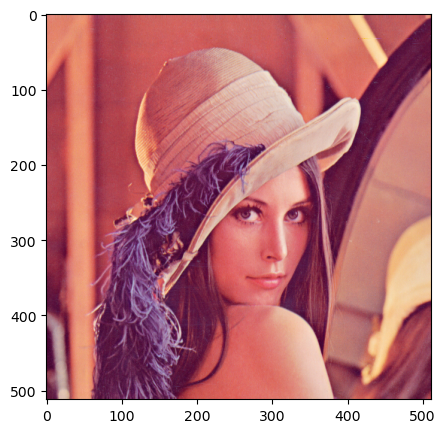

In [6]:
# ngarkojme imazhin nga pathi perkates
image = Image.open("lenna.png")
# lexojme imazhin dhe e shfaqim ate
plt.figure(figsize=(5,5))
plt.imshow(image)
plt.show()

Nese $H$ nje proces linear dhe invariant ndaj pozicionit,
atéheré imazhi i degraduarjepet néfushen hapésinor nga :

$$
g(x,y) = h(x,y)*f(x,y)+n(x,y)
$$

Modeli i imazhit te degraduar ne fushen e frekuences jepet nga:

$$
G(u,v) = H(u,v)F(u,v)+N(u,v)
$$


### Deklarimi i Procesit të Degradimit (Zhurmës dhe Filtrimi)

In [9]:
# Ngarko imazhin
image = Image.open("lenna.png")
image = image.convert('L')  # Në këtë rast, e konvertojmë në grayscale
image = np.array(image)

In [10]:
#ndertojme funksionin qe realion futjen e zhurmave:

#### Raste te ndryshme zhurmash: disa po i paraqesim me posht:

##### 1) Zhurma Gaussiane (me parametra të ndryshëm)

In [14]:
# Funksioni për të shtuar zhurmën Gaussiane
def add_gaussian_noise(image, mean=0, std=40):
    """Shton zhurmë Gaussiane me mesataren dhe devijimin standard të dhënë."""
    noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + noise
    return np.clip(noisy_image, 0, 255)

In [15]:
# Shtimi i zhurmës Gaussiane me parametra të ndryshëm
noisy_image_gaussian = add_gaussian_noise(np.array(image), mean=0, std=20)


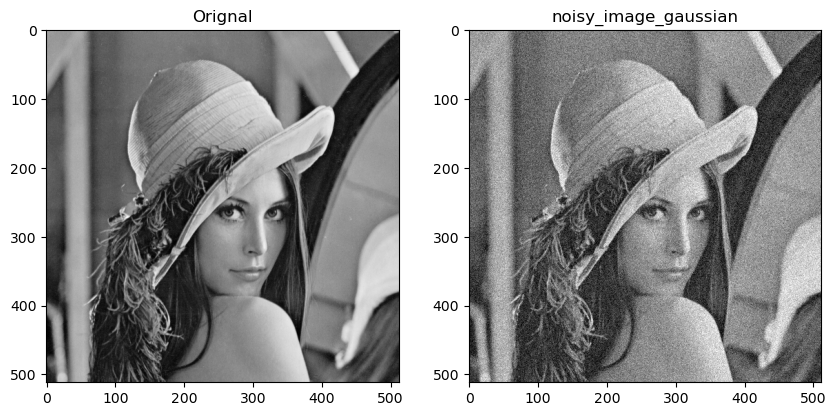

In [16]:
plot_image(image, noisy_image_gaussian, title_1="Orignal", title_2="noisy_image_gaussian", gray = "yes")

In [17]:
noisy_image_gaussian

array([[148.88275002, 174.82542418, 146.67146786, ..., 164.47610725,
        165.2498275 , 143.04685453],
       [144.81003574, 158.25535016, 182.87792317, ..., 188.24842662,
        128.1631686 ,  86.98917789],
       [136.55092726, 135.74845246, 137.55363302, ..., 130.59160593,
        122.39256237, 142.39819527],
       ...,
       [ 54.79532078,  50.2320811 ,  46.49780264, ..., 114.33421868,
         79.51318795,  84.42691029],
       [ 50.80923245,  52.80749136,  61.7774273 , ..., 119.78325885,
        103.10181874, 125.2209974 ],
       [ 50.88057809,  49.58560517,  74.77237313, ..., 107.52004613,
        141.76411206, 107.72860406]])

In [18]:
noisy_image_gaussian = np.clip(noisy_image_gaussian, 0, 255).astype(np.uint8)


In [19]:
noisy_image_gaussian

array([[148, 174, 146, ..., 164, 165, 143],
       [144, 158, 182, ..., 188, 128,  86],
       [136, 135, 137, ..., 130, 122, 142],
       ...,
       [ 54,  50,  46, ..., 114,  79,  84],
       [ 50,  52,  61, ..., 119, 103, 125],
       [ 50,  49,  74, ..., 107, 141, 107]], dtype=uint8)

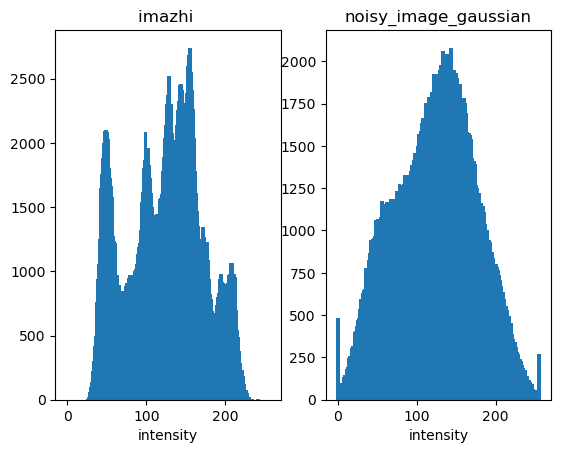

In [20]:
plot_hist(np.array(image), noisy_image_gaussian,title_old="imazhi ", title_new="noisy_image_gaussian")

##### 2) Zhurma Poisson

Zhurma Poisson përdoret shpesh në përpunimin e imazheve mjekësore, pasi ajo është më e natyrshme kur intensiteti i pikseleve është i lidhur me ngjarje të pavarura, si ndodhitë e fotoneve që ndodhin në kamerat optike.

In [22]:
# Funksioni për të shtuar zhurmën Poisson
def add_poisson_noise(image):
    """Shton zhurmë Poisson bazuar në intensitetin e imazhit."""
    noisy_image = np.random.poisson(image).astype(np.float32)
    return np.clip(noisy_image, 0, 255)


In [23]:
# Shtimi i zhurmës Poisson
noisy_image_poisson = add_poisson_noise(np.array(image))


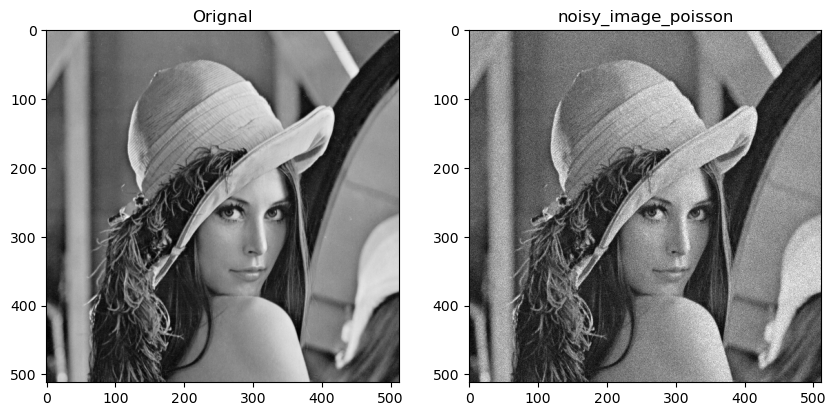

In [24]:
plot_image(np.array(image), noisy_image_poisson, title_1="Orignal", title_2="noisy_image_poisson", gray = "yes")

In [25]:
 noisy_image_poisson

array([[158., 175., 130., ..., 169., 161., 136.],
       [163., 170., 153., ..., 168., 145., 154.],
       [169., 166., 129., ..., 144., 145., 148.],
       ...,
       [ 37.,  41.,  45., ..., 115., 100., 106.],
       [ 45.,  41.,  45., ..., 101., 109., 123.],
       [ 47.,  54.,  66., ..., 107., 101.,  95.]], dtype=float32)

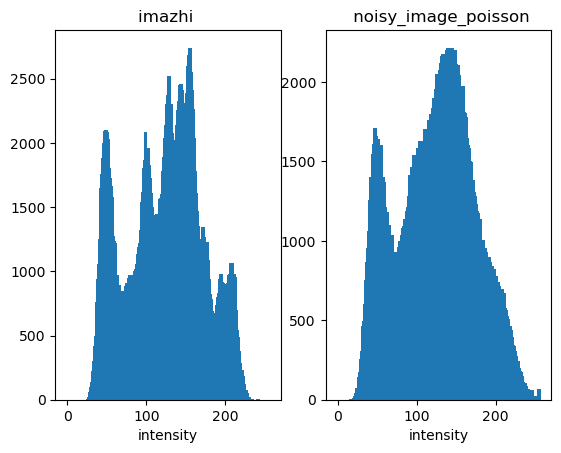

In [26]:
plot_hist(np.array(image), noisy_image_poisson,title_old="imazhi ", title_new=" noisy_image_poisson")

##### 3) Zhurma Uniforme
Zhurma uniforme është një shpërndarje ku intensiteti i zhurmës është i shpërndarë në mënyrë të barabartë në intervalin e mundshëm (p.sh., ndërmjet -1 dhe 1).

In [27]:
# Funksioni për të shtuar zhurmën uniforme
def add_uniform_noise(image, low=-10, high=10):
    """Shton zhurmë uniforme në imazh."""
    noise = np.random.uniform(low, high, image.shape)
    noisy_image = image + noise
    return np.clip(noisy_image, 0, 255), noise



In [29]:

# Shtimi i zhurmës uniforme
noisy_image_uniform, noise = add_uniform_noise(np.array(image),  low=10, high=100)

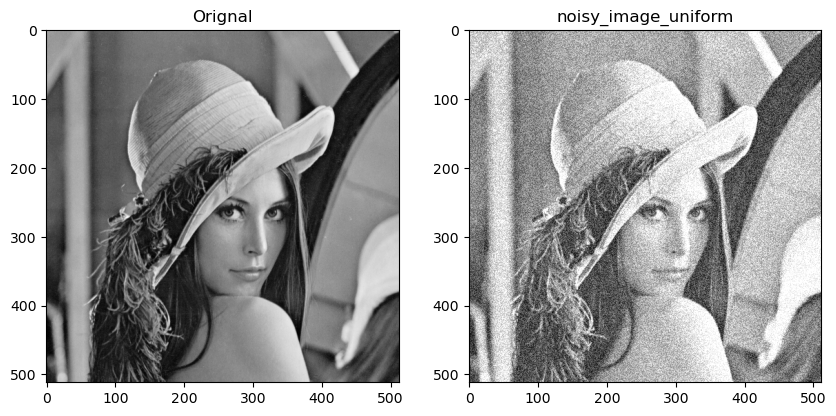

In [30]:
plot_image(image, noisy_image_uniform, title_1="Orignal", title_2="noisy_image_uniform", gray = "yes")

In [31]:
noisy_image_uniform

array([[220.193213  , 183.38154776, 211.46735052, ..., 221.58041275,
        203.1904822 , 170.80182849],
       [218.26236858, 253.20566678, 212.39906524, ..., 255.        ,
        253.4428281 , 198.89752547],
       [204.27886889, 212.54696433, 209.49190929, ..., 181.41053603,
        204.90687266, 189.24368462],
       ...,
       [110.09997891,  81.79893263,  81.28996774, ..., 193.17380459,
        114.6134966 , 142.92449151],
       [116.13081544,  98.0855718 , 120.43515249, ..., 157.91382314,
        159.66917852, 139.17338267],
       [133.9978916 ,  98.09733477, 119.55603743, ..., 139.58155797,
        135.09475492, 190.28461148]])

In [39]:
noisy_image_uniform = np.clip(noisy_image_uniform, 0, 255).astype(np.uint8)


In [40]:
noisy_image_uniform

array([[58, 21, 49, ..., 51, 48, 42],
       [56, 91, 50, ..., 94, 98, 70],
       [42, 50, 47, ..., 11, 49, 61],
       ...,
       [67, 38, 31, ..., 89, 14, 44],
       [72, 54, 65, ..., 53, 54, 31],
       [89, 54, 64, ..., 35, 30, 82]], dtype=uint8)

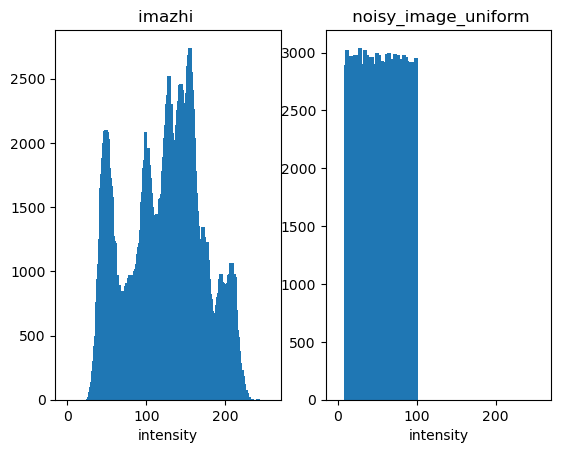

In [41]:
plot_hist(np.array(image), noisy_image_uniform,title_old="imazhi ", title_new=" noisy_image_uniform")

In [42]:
noise

array([[58.193213  , 21.38154776, 49.46735052, ..., 51.58041275,
        48.1904822 , 42.80182849],
       [56.26236858, 91.20566678, 50.39906524, ..., 94.28962824,
        98.4428281 , 70.89752547],
       [42.27886889, 50.54696433, 47.49190929, ..., 11.41053603,
        49.90687266, 61.24368462],
       ...,
       [67.09997891, 38.79893263, 31.28996774, ..., 89.17380459,
        14.6134966 , 44.92449151],
       [72.13081544, 54.0855718 , 65.43515249, ..., 53.91382314,
        54.66917852, 31.17338267],
       [89.9978916 , 54.09733477, 64.55603743, ..., 35.58155797,
        30.09475492, 82.28461148]])

In [ ]:
noise = np.clip(noise, 0, 255).astype(np.uint8)


In [ ]:
plot_hist(np.array(image), noise ,title_old="imazhi ", title_new=" noise")

##### 4) Zhurma Salt-and-Pepper
Zhurma salt-and-pepper është një lloj zhurme që bën që disa pikse të bëhen të bardha (255) ose të zeza (0).

In [49]:
# Funksioni për të shtuar zhurmë Salt-and-Pepper
def add_salt_and_pepper_noise(image, amount=0.02):
    """Shton zhurmë Salt-and-Pepper në imazh."""
    noisy_image = np.array(image)
    total_pixels = noisy_image.size
    num_salt = int(amount * total_pixels)
    num_pepper = int(amount * total_pixels)

    # Shto 'salt'
    salt_coords = [np.random.randint(0, i-1, num_salt) for i in noisy_image.shape]
    noisy_image[salt_coords[0], salt_coords[1]] = 255

    # Shto 'pepper'
    pepper_coords = [np.random.randint(0, i-1, num_pepper) for i in noisy_image.shape]
    noisy_image[pepper_coords[0], pepper_coords[1]] = 70

    return noisy_image


In [50]:
# Shtimi i zhurmës Salt-and-Pepper
noisy_image_salt_pepper = add_salt_and_pepper_noise(np.array(image), amount=0.03)


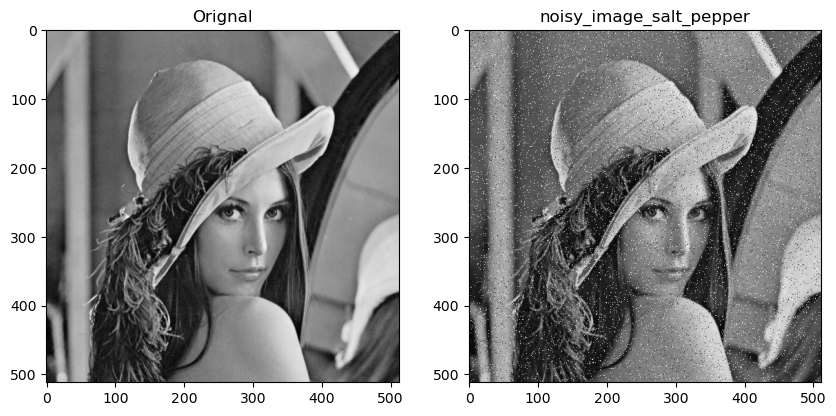

In [51]:
plot_image(image, noisy_image_salt_pepper, title_1="Orignal", title_2="noisy_image_salt_pepper", gray = "yes")

In [52]:
noisy_image_salt_pepper

array([[162, 162, 162, ..., 170, 155, 128],
       [162, 162, 162, ..., 170, 155, 128],
       [162, 162, 162, ..., 170, 155, 128],
       ...,
       [ 43,  43,  50, ..., 104, 100,  98],
       [ 44,  44,  55, ..., 104, 255, 108],
       [ 44,  44,  55, ..., 104, 105, 108]], dtype=uint8)

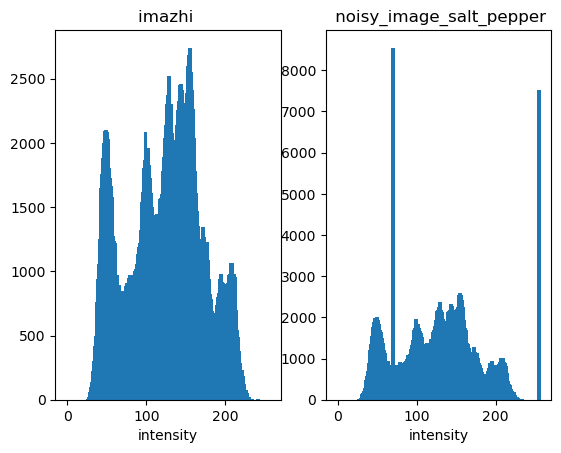

In [53]:

image = np.array(image)
plot_hist(image, noisy_image_salt_pepper, title_old="imazhi ", title_new=" noisy_image_salt_pepper")

##### 5) Zhurma Eksponenciale
Zhurma eksponenciale mund të krijohet me përdorimin e funksionit `np.random.exponential()` nga NumPy, i cili gjeneron vlera të shpërndara eksponencialisht.

In [54]:
# Funksioni për të shtuar zhurmë eksponenciale
def add_exponential_noise(image, scale=30):
    """Shton zhurmë eksponenciale në imazh."""
    noise = np.random.exponential(scale, image.shape)
    noisy_image = image + noise
    return np.clip(noisy_image, 0, 255), noise



In [67]:
# Shtimi i zhurmës eksponenciale
noisy_image_exponential, noise = add_exponential_noise(np.array(image), scale=30)

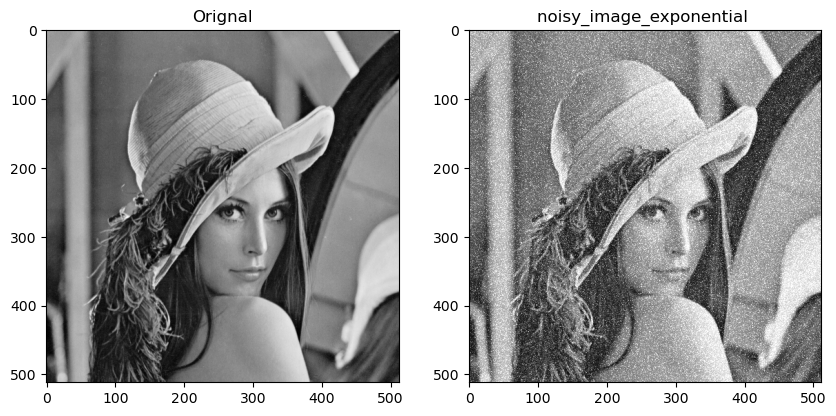

In [68]:
plot_image(image, noisy_image_exponential, title_1="Orignal", title_2="noisy_image_exponential ", gray = "yes")

In [69]:
# Krijimi i histogramës


In [70]:
noisy_image_exponential

array([[162.08793047, 170.25912841, 162.06412802, ..., 181.77932063,
        173.51510173, 136.46953696],
       [162.79257526, 164.02123889, 216.92629275, ..., 192.11760237,
        228.78067209, 160.88590252],
       [228.31449006, 163.72819531, 255.        , ..., 190.24982636,
        184.43849131, 143.8831058 ],
       ...,
       [ 48.59659095,  55.40400207,  55.7915031 , ..., 125.15587327,
        109.16902281, 124.3164417 ],
       [ 49.72344909,  97.96956759, 111.96124638, ..., 107.3199569 ,
        121.48236621, 111.48843506],
       [ 45.79405722,  78.75431019, 118.52631812, ..., 161.51900898,
        134.99730324, 122.75416542]])

In [71]:
noisy_image_exponential = np.clip(noisy_image_exponential, 0, 255).astype(np.uint8)


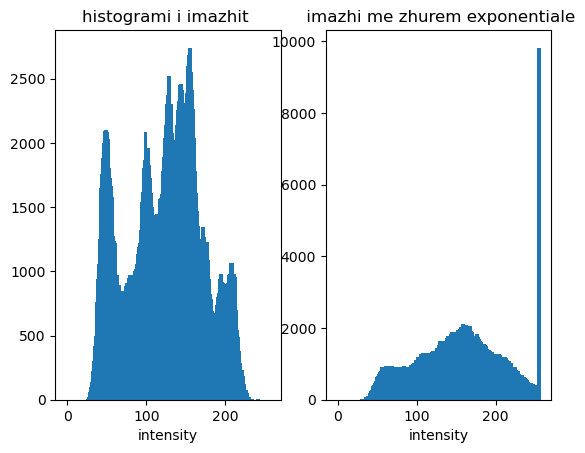

In [72]:
plot_hist(image, noisy_image_exponential, title_old="histogrami i imazhit ", title_new=" imazhi me zhurem exponentiale")

**kemi edhe zhurma te tjera, si ajo Rayleigh, periodike, etj.**

#### Zhurma periodike (filtrimi)

`Zhurma periodike` është një lloj zhurme që ndodh kur valët e zhurmës janë të përsëritura me një periudhë të caktuar, dhe zakonisht ndodhin për shkak të ndërhyrjeve elektrike ose elektromekanike gjatë marrjes së imazhit. Ky lloj zhurme zakonisht është e varur nga hapësira dhe është e natyrshme për t’u simuluar në domenin e frekuencës.

- Për të simuluar një zhurmë periodike dhe për të aplikuar një filtrin për ta reduktuar këtë zhurmë, mund të përdorim një sinjal të sinusoidal (për të imituar zhurmën periodike) dhe ta shtojmë atë në imazh. Pas kësaj, mund të zbatojmë një filtrat të domenit të frekuencës për të hequr atë.

**Hapat e Procesit:**

- Simulimi i Zhurmës Periodike:

- Filtrimi i Zhurmës në Domenin e Frekuencës:

Përdorimi i Transformimit të Fourier për të kaluar imazhin në domenin e frekuencës dhe përdorimi i një filtri të uljes së frekuencës (`low-pass filter`) për të larguar komponentët periodikë të zhurmës.

In [73]:
# hapi 1

In [74]:
# Parametrat për zhurmën periodike
image = np.array(image)
rows, cols = image.shape
f = 10  # frekuenca e zhurmës (njësitë periodike)
amplitude = 30  # amplituda e zhurmës

# Krijimi i zhurmës periodike (sinusoidale)
x, y = np.meshgrid(np.arange(cols), np.arange(rows))
noise = amplitude * np.sin(2 * np.pi * f * x / cols)

# Shtimi i zhurmës periodike në imazh
noisy_image_periodic = image + noise



In [75]:
# hapi 2

In [76]:
#Filtrimi i Zhurmës në Domenin e Frekuencës

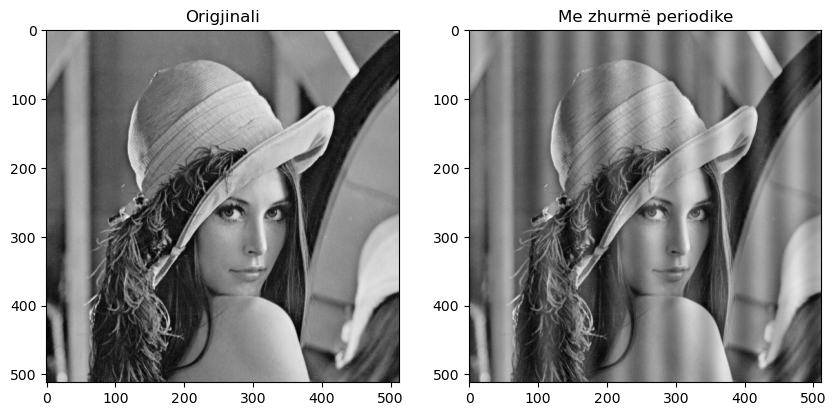

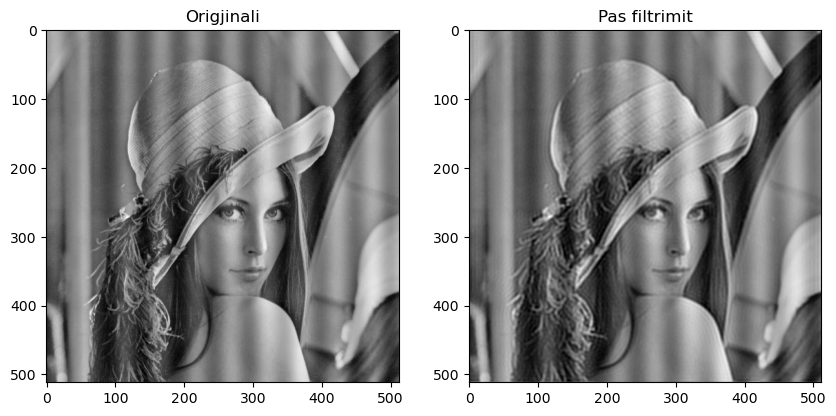

In [77]:

from scipy.fftpack import fft2, ifft2, fftshift, ifftshift


# Kalimi në domenin e frekuencës
f_image = fft2(noisy_image_periodic)
f_image_shifted = fftshift(f_image)  # 💡 Zhvendosja për të vendosur frekuencat e ulëta në qendër

# Krijimi i filtrit low-pass
low_pass_filter = np.zeros_like(f_image_shifted)
r = 90  # Radiusi
crow, ccol = rows // 2, cols // 2
for i in range(rows):
    for j in range(cols):
        if np.sqrt((i - crow) ** 2 + (j - ccol) ** 2) <= r:
            low_pass_filter[i, j] = 1

# Filtrimi
f_image_filtered = f_image_shifted * low_pass_filter +noisy_image_periodic
f_ishifted = ifftshift(f_image_filtered)  # 💡 Rikthe spektrin në pozicion normal

# Rikthimi në domenin hapësinor
filtered_image = np.abs(ifft2(f_ishifted))


# Shfaqja e rezultateve
plot_image(image, noisy_image_periodic, title_1="Origjinali", title_2="Me zhurmë periodike", gray="yes")
plot_image(noisy_image_periodic, filtered_image, title_1="Origjinali", title_2="Pas filtrimit", gray="yes")

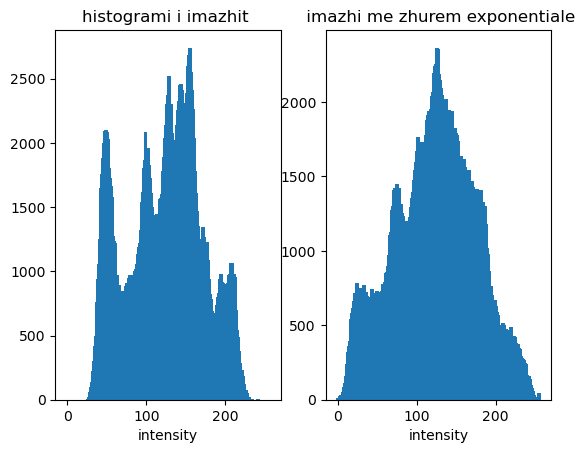

In [80]:
noisy_image_periodic = np.clip(noisy_image_periodic, 0, 255).astype(np.uint8)

plot_hist(image, noisy_image_periodic, title_old="histogrami i imazhit ", title_new=" imazhi me zhurem exponentiale")

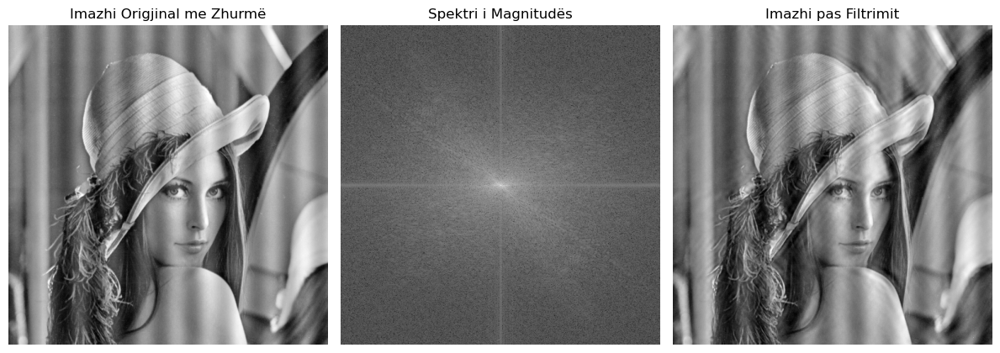

In [85]:

img = noisy_image_periodic
# 2. Apliko transformimin Fourier 2D dhe shifte qendrën
f = np.fft.fft2(img)
fshift = np.fft.fftshift(f)
magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1)

# 3. Krijo një maskë për të filtruar frekuencat e padëshiruara
rows, cols = img.shape
crow, ccol = rows // 2 , cols // 2

# Maskë e bardhë fillimisht (lejon të gjitha frekuencat)
mask = np.ones((rows, cols), dtype=np.uint8)

# Shembull: blloko disa pika në distancë nga qendra (ku shfaqet zhurma periodike)
r = 15  # rrezja e filtrit
# Pikat mund të ndryshojnë sipas vendit të zhurmës në spektrin e frekuencës
mask[crow+30-r:crow+30+r, ccol+30-r:ccol+30+r] = 0
mask[crow-30-r:crow-30+r, ccol-30-r:ccol-30+r] = 0
mask[crow+30-r:crow+30+r, ccol-30-r:ccol-30+r] = 0
mask[crow-30-r:crow-30+r, ccol+30-r:ccol+30+r] = 0

# 4. Apliko maskën dhe rikthe në domenin e hapësirës
fshift_filtered = fshift * mask
f_ishift = np.fft.ifftshift(fshift_filtered)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

# 5. Shfaq rezultatet
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1), plt.imshow(img, cmap='gray')
plt.title('Imazhi Origjinal me Zhurmë'), plt.axis('off')

plt.subplot(1, 3, 2), plt.imshow(magnitude_spectrum, cmap='gray')
plt.title('Spektri i Magnitudës'), plt.axis('off')

plt.subplot(1, 3, 3), plt.imshow(img_back, cmap='gray')
plt.title('Imazhi pas Filtrimit'), plt.axis('off')

plt.tight_layout()
plt.show()


#### Filtri mesatar (Rikujtim)

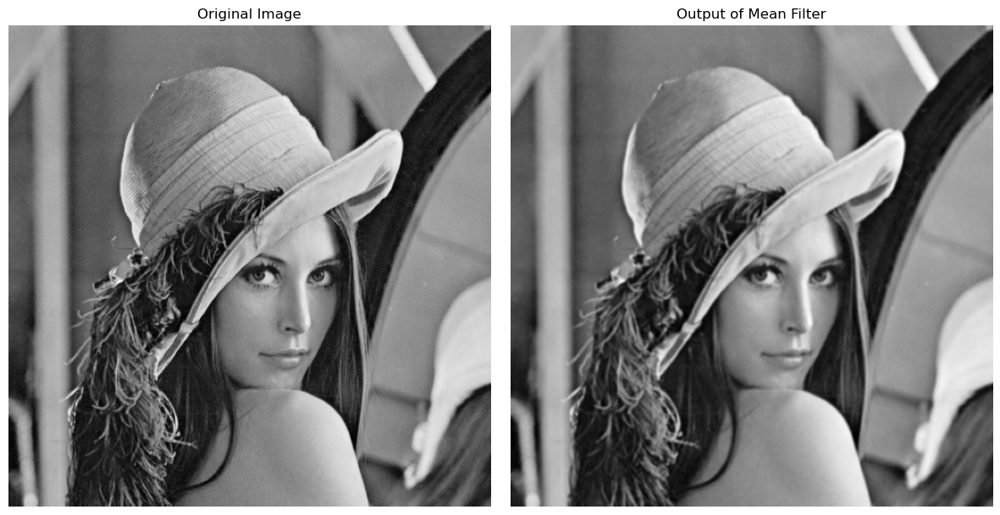

In [87]:

Img = image

# Get image dimensions
m, n = Img.shape
output = np.zeros((m, n), dtype=float)

# Apply manual mean filter
for i in range(m):
    for j in range(n):
        rmin = max(0, i - 1)
        rmax = min(m, i + 2)
        cmin = max(0, j - 1)
        cmax = min(n, j + 2)
        temp = Img[rmin:rmax, cmin:cmax]
        output[i, j] = np.mean(temp)

# Convert back to uint8 for display
output = np.uint8(output)

# Show the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(Img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(output, cmap='gray')
plt.title('Output of Mean Filter')
plt.axis('off')

plt.tight_layout()
plt.show()


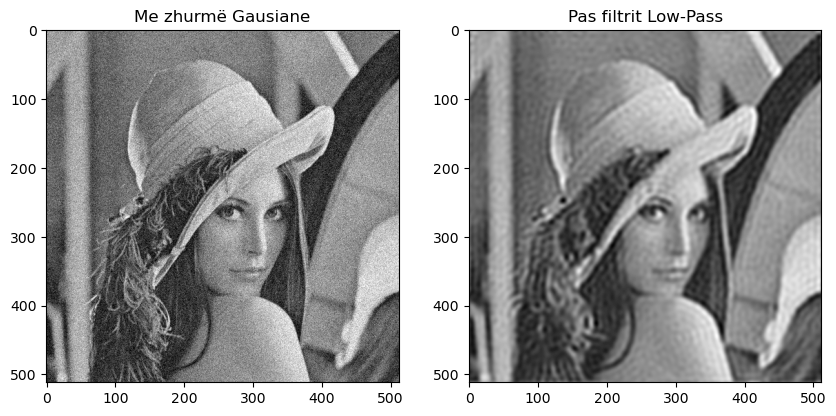

In [88]:


# 2. Shto zhurmë Gausiane
mean = 0
std = 20
gaussian_noise = np.random.normal(mean, std, image.shape)
noisy_image = image + gaussian_noise
noisy_image = np.clip(noisy_image, 0, 255)

# 3. Kalimi në domenin e frekuencës
f_transform = fft2(noisy_image)
f_shifted = fftshift(f_transform)

# 4. Krijo një *low-pass filter* në qendër
rows, cols = image.shape
crow, ccol = rows // 2 , cols // 2
radius = 50  # më i vogël = më shumë blur

mask = np.zeros((rows, cols))
for i in range(rows):
    for j in range(cols):
        if np.sqrt((i - crow)**2 + (j - ccol)**2) <= radius:
            mask[i, j] = 1

# 5. Aplikimi i filtrit
f_filtered = f_shifted * mask

# 6. Rikthim në domenin hapësinor
f_ishift = ifftshift(f_filtered)
img_back = ifft2(f_ishift)
img_back = np.abs(img_back)

# 7. Vizualizim
plot_image(noisy_image, img_back, "Me zhurmë Gausiane", "Pas filtrit Low-Pass", gray="yes")


### Vlerësimi i parametrave të zhurmës 

In [89]:
lena_me_zhurem  = np.copy(noisy_image)

In [90]:
rajoni = lena_me_zhurem[220:280,250:350]
rajoni

array([[ 84.04986086,  81.20342451,  70.65427003, ...,  49.35532309,
         55.7821532 ,  55.47485114],
       [ 71.28395263, 104.35450939, 102.40471941, ...,  69.12651681,
         59.48113478,  33.19605537],
       [ 93.50773487, 109.43729291, 136.16188474, ...,  79.94905117,
         22.07782078,  53.18757629],
       ...,
       [170.54846505, 131.78395478, 153.96062601, ...,  34.70102821,
         93.66249444,  21.78742842],
       [155.54622749, 178.11958658, 143.94931336, ...,  72.83173026,
         53.37383472,  34.50279383],
       [178.13880591, 140.31563161, 125.68959666, ...,  76.14834467,
         54.78146807,  45.18420382]])

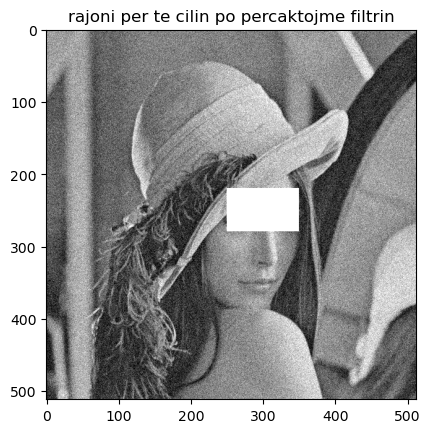

In [91]:
lena_me_zhurem2 = np.copy(lena_me_zhurem)
lena_me_zhurem2[220:280,250:350] = 255
plt.imshow(lena_me_zhurem2, 'gray')
plt.title("rajoni per te cilin po percaktojme filtrin")
plt.show()

In [92]:
#parametrat:

In [93]:
# Llogaritim parametrat statistikore të zhurmës
mesatarja = np.mean(rajoni)
devijimi_standard = np.std(rajoni)

print(f"Mesatarja e zhurmës në rajonin e përzgjedhur: {mesatarja:.2f}")
print(f"Devijimi standard i zhurmës në rajonin e përzgjedhur: {devijimi_standard:.2f}")


Mesatarja e zhurmës në rajonin e përzgjedhur: 147.45
Devijimi standard i zhurmës në rajonin e përzgjedhur: 53.57


In [94]:

# Për krahasim, mund të llogarisim edhe për të njëjtin rajon në imazhin origjinal
origjinali = image[220:280,250:350]
diferenca = rajoni - origjinali
mesatarja_zhurmes = np.mean(diferenca)
dev_zhurmes = np.std(diferenca)

print(f"Mesatarja e vlerave të zhurmës (diferenca): {mesatarja_zhurmes:.2f}")
print(f"Devijimi standard i zhurmës (diferenca): {dev_zhurmes:.2f}")

Mesatarja e vlerave të zhurmës (diferenca): 0.04
Devijimi standard i zhurmës (diferenca): 19.90


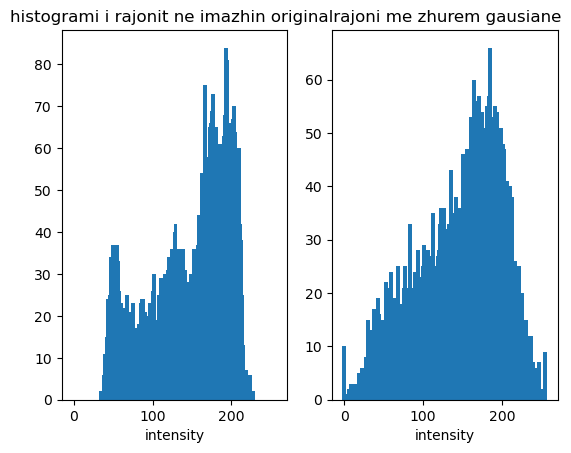

In [96]:
rajoni = np.clip(rajoni, 0, 255).astype(np.uint8)

plot_hist(origjinali, rajoni, title_old="histogrami i rajonit ne imazhin original ", title_new=" rajoni me zhurem gausiane")

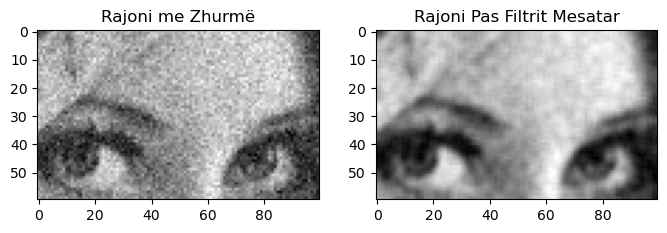

Devijimi standard PARA filtrit: 53.57
Devijimi standard PAS filtrit: 48.85


In [97]:

# Aplikojmë filtrin mesatar 3x3 në këtë rajon
# Mund të provohet edhe 5x5 në varësi të zhurmës
rajoni_filtruar = cv2.blur(rajoni, (3, 3))

# Vizualizojmë para dhe pas filtrimit
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(rajoni, cmap='gray')
plt.title("Rajoni me Zhurmë")
plt.subplot(1, 2, 2)
plt.imshow(rajoni_filtruar, cmap='gray')
plt.title("Rajoni Pas Filtrit Mesatar")
plt.show()

# Opsionale: llogaritim devijimin standard para dhe pas
std_para = np.std(rajoni)
std_pasca = np.std(rajoni_filtruar)
print(f"Devijimi standard PARA filtrit: {std_para:.2f}")
print(f"Devijimi standard PAS filtrit: {std_pasca:.2f}")

In [99]:
std_org = np.std(origjinali)
print(f"Devijimi standard filtrit: {std_org:.2f}")

Devijimi standard filtrit: 49.68


#### Gjithashtu filtrin qe percaktuam tani per rjonin mund ta perdorim ne te gjithe imazhin:

Text(0.5, 1.0, 'Pas filtrit mesatar nga rajoni')

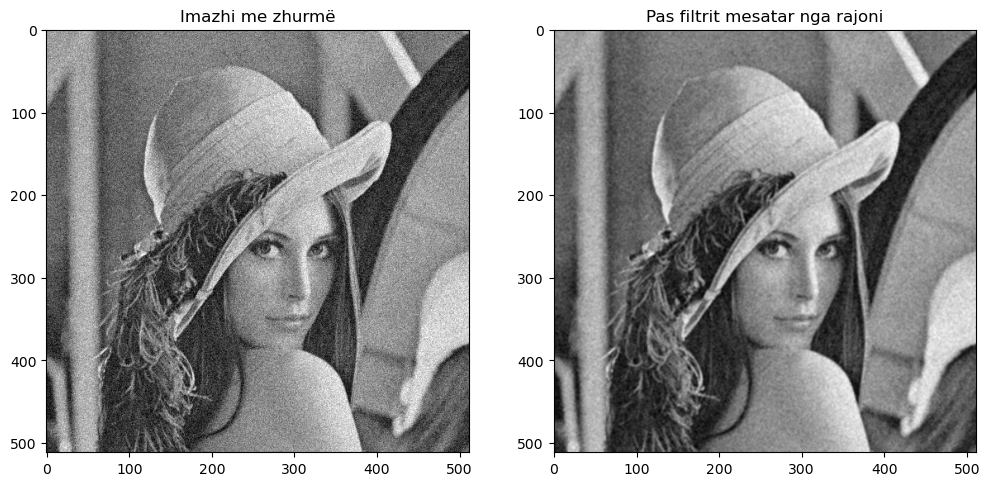

In [100]:
# Llogaritja e mesatares së rajonit
mesatarja_rajonit = np.mean(rajoni)

# Krijimi i filtrit mesatar me madhësi 3x3 dhe vlera të barabarta me mesataren e rajonit
kernel_size = 3
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) * (mesatarja_rajonit / (kernel_size**2))

# Aplikimi i këtij filtri në të gjithë imazhin
filtered_image_custom = cv2.filter2D(lena_me_zhurem, -1, kernel)

# Shfaqja e rezultateve
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(lena_me_zhurem, cmap='gray')
plt.title("Imazhi me zhurmë")

plt.subplot(1, 2, 2)
plt.imshow(filtered_image_custom, cmap='gray')
plt.title("Pas filtrit mesatar nga rajoni")

In [101]:
## filtri mesatar Gjeometrik per rajonin edhe per zonen:

In [103]:
#ndertimi

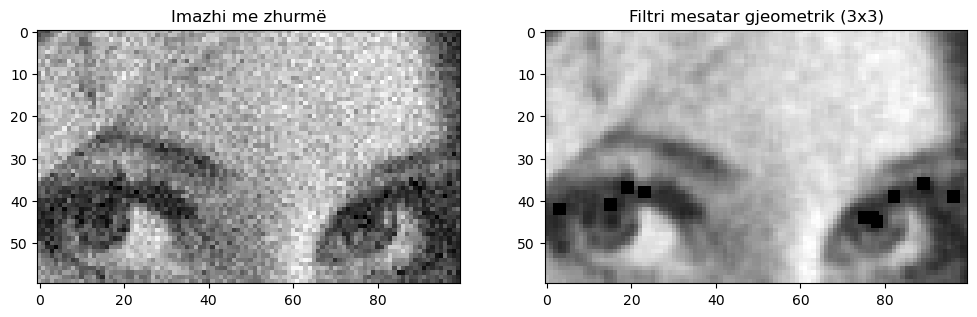

In [104]:

from scipy.ndimage import generic_filter

# Funksioni i filtrit mesatar gjeometrik
def geometric_mean_filter(window):
    product = np.prod(window)
    return product ** (1.0 / len(window))



# Aplikimi i filtrit mesatar gjeometrik me dritare 3x3
rajoni_image_geom = generic_filter(rajoni.astype(np.float32), geometric_mean_filter, size=3)

# Shfaqja e rezultateve
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(rajoni, cmap='gray')
plt.title("Imazhi me zhurmë")

plt.subplot(1, 2, 2)
plt.imshow(rajoni_image_geom, cmap='gray')
plt.title("Filtri mesatar gjeometrik (3x3)")

plt.show()


In [105]:
### aplikimi te imazhi

Mesatarja gjeometrike e rajonit: 129.64217
Kernel: [[14.404685 14.404685 14.404685]
 [14.404685 14.404685 14.404685]
 [14.404685 14.404685 14.404685]]


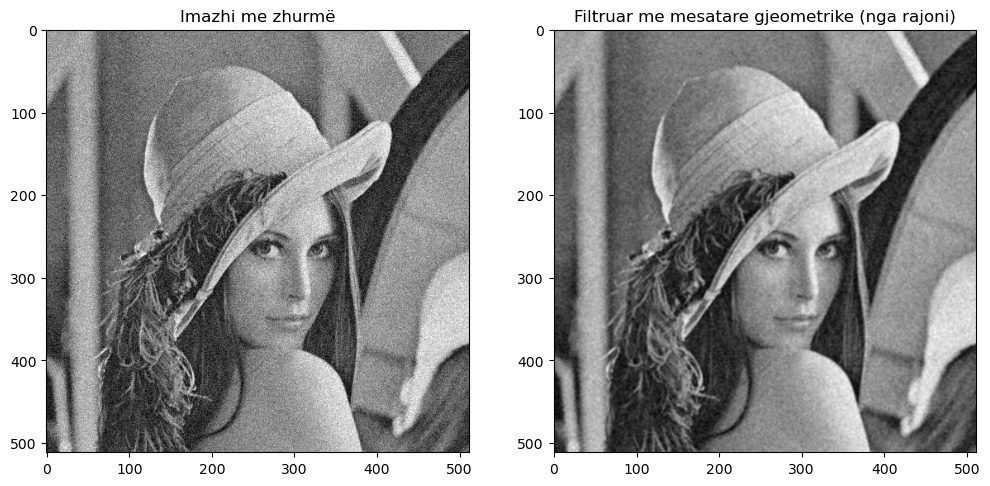

In [106]:

def geometric_mean_filter(window, epsilon=1e-6):
    window = np.where(window <= 0, epsilon, window)  # Zëvendëson 0 ose negative me epsilon
    log_vals = np.log(window)
    mean_log = np.mean(log_vals)
    return np.exp(mean_log)


# Llogaritja e mesatares gjeometrike për rajonin
rajoni_flat = rajoni.flatten().astype(np.float32)
geometric_mean_rajonit = geometric_mean_filter(rajoni_flat)

# Kontrollo vlerën
print("Mesatarja gjeometrike e rajonit:", geometric_mean_rajonit)

# Krijimi i kernelit 3x3 me vlera të barabarta
kernel_size = 3
kernel = np.ones((kernel_size, kernel_size), dtype=np.float32)
kernel = (geometric_mean_rajonit / kernel.sum()) * kernel

# Kontrollo kernelin
print("Kernel:", kernel)

# Aplikimi i këtij filtri në të gjithë imazhin
filtered_image_geom = cv2.filter2D(lena_me_zhurem.astype(np.float32), -1, kernel)

# Shfaqja e rezultateve
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(lena_me_zhurem, cmap='gray')
plt.title("Imazhi me zhurmë")

plt.subplot(1, 2, 2)
plt.imshow(filtered_image_geom, cmap='gray')
plt.title("Filtruar me mesatare gjeometrike (nga rajoni)")

plt.show()

##### Filtri Mesatar Harmonik (Harmonic Mean Filter)

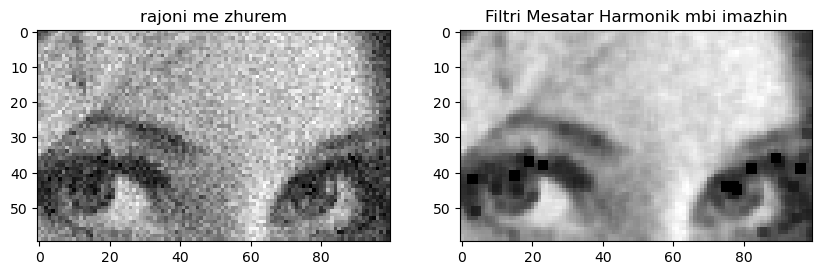

In [107]:
from scipy.ndimage import generic_filter
import numpy as np

def harmonic_mean_filter(window, epsilon=1e-6):
    window = np.where(window <= 0, epsilon, window)  # shmang pjestimin me 0
    return len(window) / np.sum(1.0 / window)

# Aplikimi në një imazh
filtered_rajon = generic_filter(rajoni.astype(np.float32), harmonic_mean_filter, size=3)

# 7. Vizualizim
plot_image(rajoni, filtered_rajon, "rajoni me zhurem", "Filtri Mesatar Harmonik mbi imazhin", gray="yes")


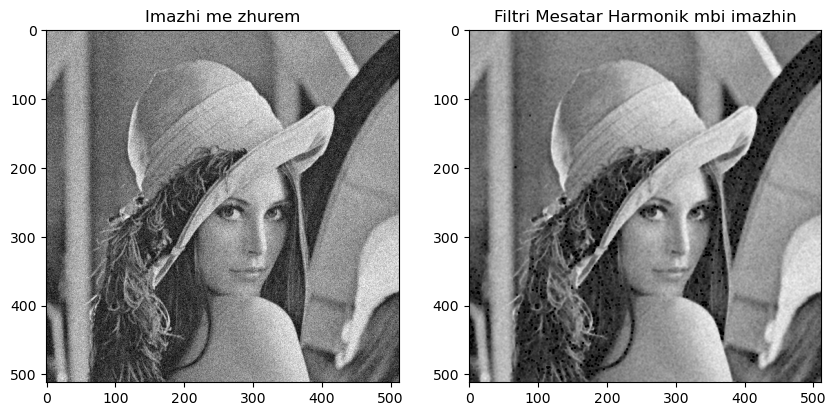

In [109]:
# Aplikimi në një imazh
filtered_image = generic_filter(lena_me_zhurem.astype(np.float32), harmonic_mean_filter, size=3)

# 7. Vizualizim
plot_image(lena_me_zhurem, filtered_image, "Imazhi me zhurem", "Filtri Mesatar Harmonik mbi imazhin", gray="yes")


##### Filtri mesatar kundra harmonik 

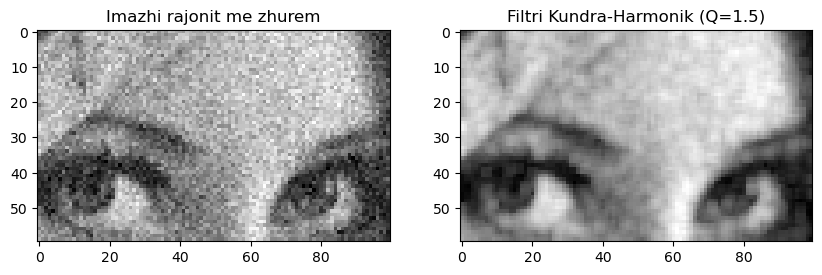

In [110]:

def contraharmonic_mean_filter(window, Q, epsilon=1e-6):
    window = np.array(window, dtype=np.float32)
    numerator = np.sum(window ** (Q + 1))
    denominator = np.sum((window + epsilon) ** Q)  # shmang pjestim me 0
    return numerator / (denominator + epsilon)

# Wrapper për përdorim me generic_filter
Q = 1.5  # Zgjidh Q në varësi të llojit të zhurmës
def chm_wrapper(window):
    return contraharmonic_mean_filter(window, Q)

# Aplikimi i filtrit në imazh me zhurmë
filtered_image_chm = generic_filter(rajoni.astype(np.float32), chm_wrapper, size=3)
# 7. Vizualizim
plot_image(rajoni, filtered_image_chm, "Imazhi rajonit me zhurem", f"Filtri Kundra-Harmonik (Q={Q})", gray="yes")



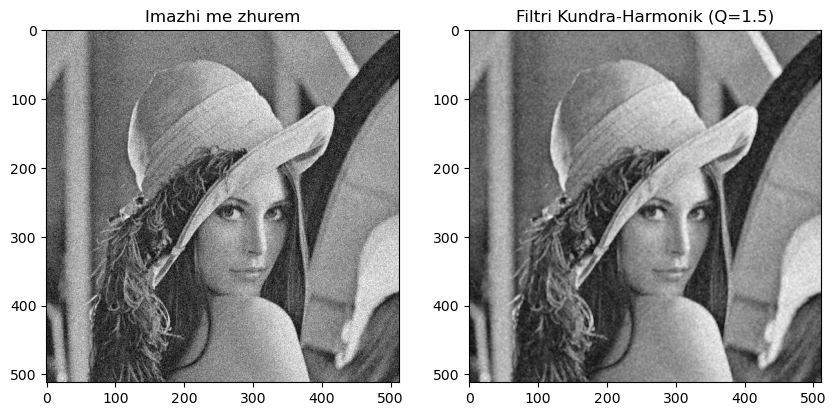

In [111]:

# Aplikimi i filtrit në imazh me zhurmë
filtered_image_chm = generic_filter(lena_me_zhurem.astype(np.float32), chm_wrapper, size=3)
# 7. Vizualizim
plot_image(lena_me_zhurem, filtered_image_chm, "Imazhi me zhurem", f"Filtri Kundra-Harmonik (Q={Q})", gray="yes")



###  Filtrimi hapësinor: Filtrat e rendit-statistikës

#### (1) Filtri Median:
$$
f(x, y) = \text{median} \{ g(s, t) \} \quad \text{ku} \ (s, t) \in S
$$

#### (2) Filtri Maksimum:
$$
f(x, y) = \max \{ g(s, t) \} \quad \text{ku} \ (s, t) \in S
$$

#### (3) Filtri Minimal:
$$
f(x, y) = \min \{ g(s, t) \} \quad \text{ku} \ (s, t) \in S
$$


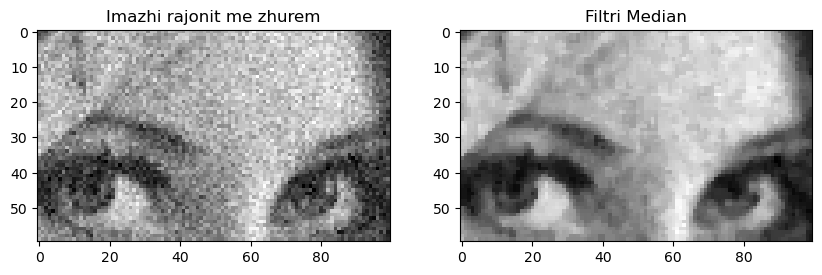

In [112]:
from scipy.ndimage import median_filter, maximum_filter, minimum_filter

# Madhësia e bërthamës (kernel size), zakonisht 3x3 ose 5x5
kernel_size = 3

# 1. Filtri Median
median_filtered = median_filter(rajoni, size=kernel_size)
plot_image(rajoni, median_filtered, "Imazhi rajonit me zhurem", "Filtri Median", gray="yes")


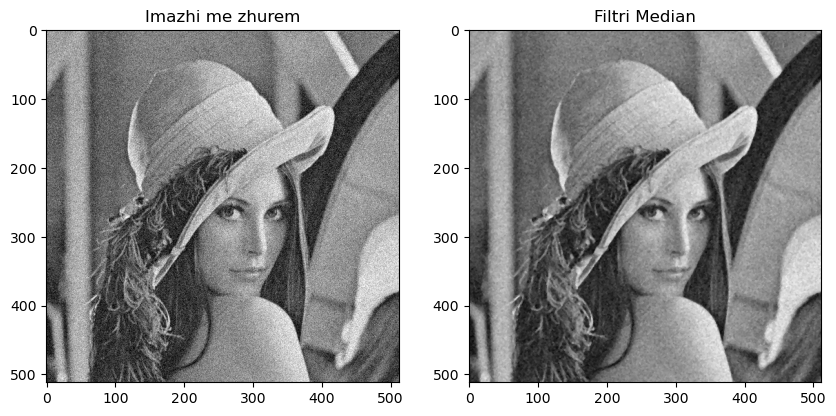

In [113]:
median_filtered = median_filter(lena_me_zhurem, size=kernel_size)
plot_image(lena_me_zhurem, median_filtered, "Imazhi me zhurem", "Filtri Median", gray="yes")

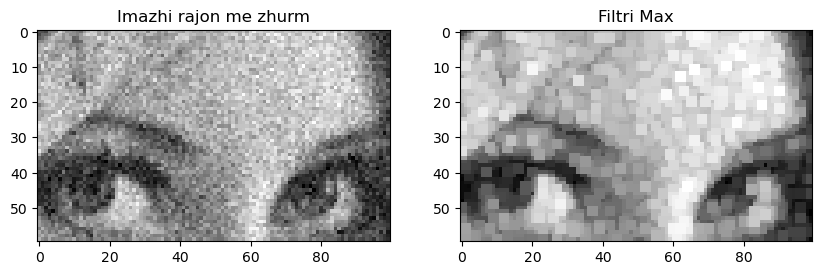

In [114]:

# 2. Filtri Maksimum
max_filtered = maximum_filter(rajoni, size=kernel_size)
plot_image(rajoni, max_filtered, "Imazhi rajon me zhurm", "Filtri Max", gray="yes")

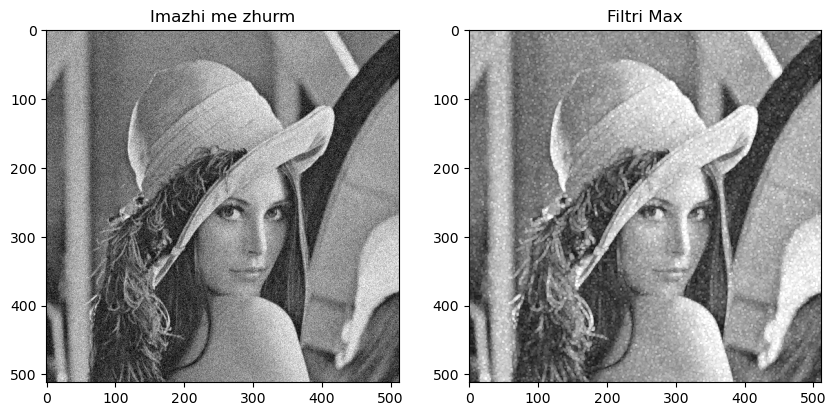

In [115]:

# 2. Filtri Maksimum
max_filtered = maximum_filter(lena_me_zhurem, size=kernel_size)
plot_image(lena_me_zhurem, max_filtered, "Imazhi me zhurm", "Filtri Max", gray="yes")

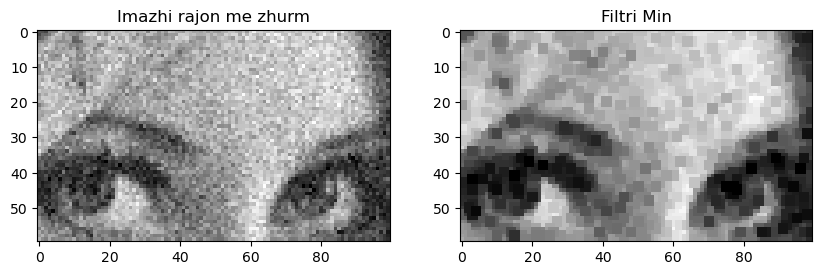

In [116]:
# 3. Filtri Minimal
min_filtered = minimum_filter(rajoni, size=kernel_size)
plot_image(rajoni, min_filtered, "Imazhi rajon me zhurm", "Filtri Min", gray="yes")

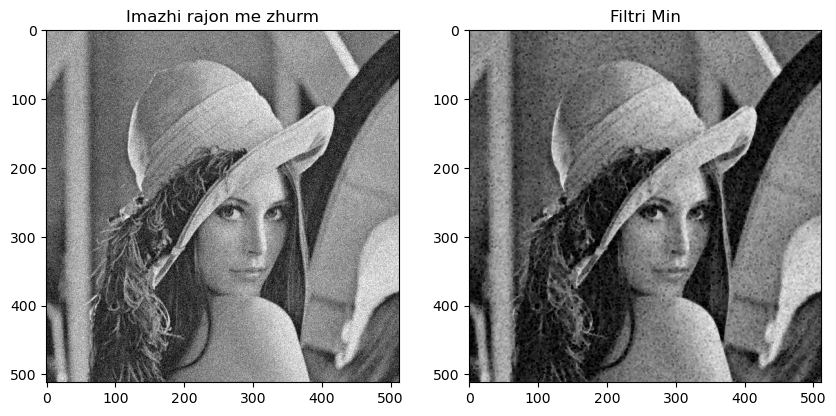

In [117]:
# 3. Filtri Minimal
min_filtered = minimum_filter(lena_me_zhurem, size=kernel_size)
plot_image(lena_me_zhurem, min_filtered, "Imazhi rajon me zhurm", "Filtri Min", gray="yes")

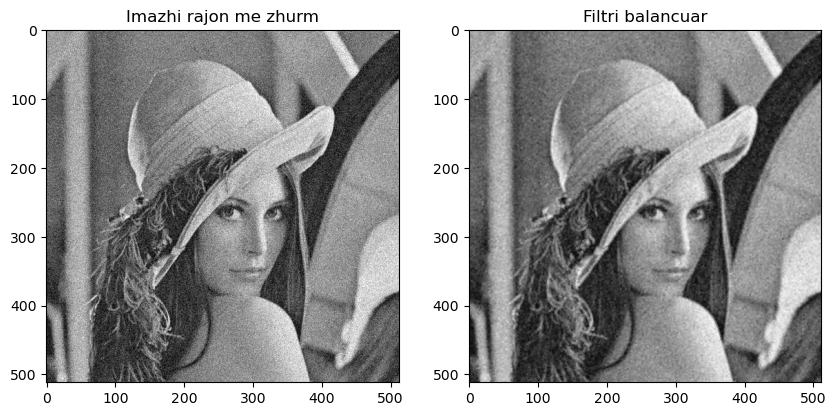

In [121]:
bal = 0.5*(min_filtered + max_filtered)
plot_image(lena_me_zhurem, bal, "Imazhi rajon me zhurm", "Filtri balancuar", gray="yes")

In [122]:
# filtri i mesatares se keputur

In [123]:
#funksioni
def alpha_trimmed_mean(img, kernel_size=3, alpha=1):
    """
    Apliko filtrin e mesatares së keputur alpha.
    
    :param img: Imazhi origjinal (në format gri)
    :param kernel_size: Madhësia e kernelit (për shembull 3x3, 5x5, etj.)
    :param alpha: Numri i pikselëve për të hequr nga të dy ekstremet (për shembull, 1 për 3x3)
    :return: Imazhi i filtruar
    """
    # Gjeni gjatësinë dhe gjerësinë e imazhit
    m, n = img.shape
    
    # Llogarit filtrin e mesatares së keputur
    output = np.zeros_like(img, dtype=np.float32)
    
    # Llogarit kufijtë e dritares (për kernel 3x3)
    offset = kernel_size // 2
    
    for i in range(offset, m - offset):
        for j in range(offset, n - offset):
            # Nxirrni fqinjësinë e pikselit
            region = img[i - offset:i + offset + 1, j - offset:j + offset + 1]
            
            # Përshtat alfa (përjashtoni pikselët më të larta dhe më të ulëtat)
            region_sorted = np.sort(region.flatten())
            trimmed_region = region_sorted[alpha: -alpha]  # Përshtat përjashtimin nga të dyja anët
            
            # Llogarit mesataren e keputur dhe ruaj rezultatin
            output[i, j] = np.mean(trimmed_region)
    
    return output.astype(np.uint8)




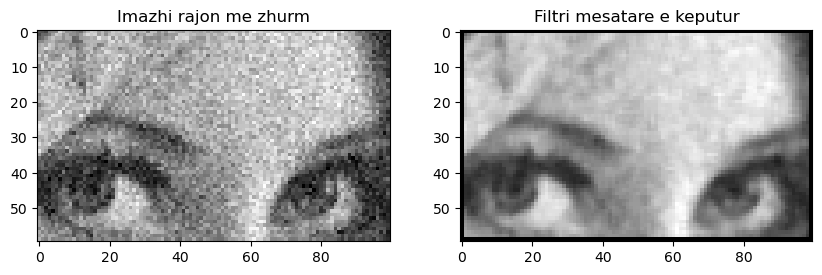

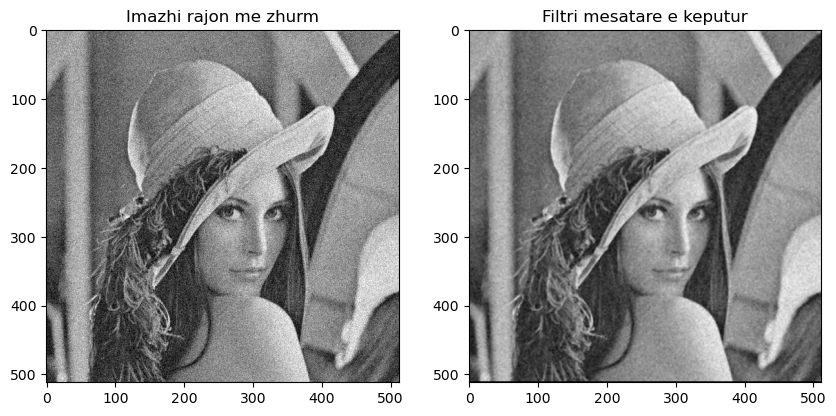

In [127]:

# Apliko filtrin e mesatares së keputur me kernel 3x3 dhe alpha = 1
kernel_size = 3
alpha = 2
filtered_img = alpha_trimmed_mean(rajoni, kernel_size, alpha)
plot_image(rajoni, filtered_img, "Imazhi rajon me zhurm", "Filtri mesatare e keputur", gray="yes")

filtered_img = alpha_trimmed_mean(lena_me_zhurem, kernel_size, alpha)
plot_image(lena_me_zhurem, filtered_img, "Imazhi rajon me zhurm", "Filtri mesatare e keputur", gray="yes")


#### Filtrat Adaptues
- Filtri adaptues është një filtër që merr parasysh vlerat e fqinjëve të një pikseli për të përcaktuar përmasat dhe parametrat e filtrimit. Kjo do të thotë se vendimi për filtrimin e një pikseli bëhet në varësi të informacionit që vjen nga fqinjët e tij.

In [130]:

def adaptive_mean_filter(img, window_size=3, threshold=10):
    """
    Filtri i mesatares adaptivë.
    
    :param img: Imazhi origjinal (në format gri)
    :param window_size: Madhësia e dritares për lëvizje (p.sh., 3x3)
    :param threshold: Prag që përdoret për të përcaktuar kur të përdoret filtri
    :return: Imazhi i filtruar
    """
    m, n = img.shape
    output = np.copy(img)
    
    # Përdor dritare të lëvizshme
    offset = window_size // 2
    
    for i in range(offset, m - offset):
        for j in range(offset, n - offset):
            # Nxirrni fqinjësinë e pikselit
            region = img[i - offset:i + offset + 1, j - offset:j + offset + 1]
            
            # Llogarit mesataren dhe devijimin standard të fqinjëve
            mean_val = np.mean(region)
            std_dev = np.std(region)
            
            # Përdor një prag për të vendosur nëse duhet të aplikohet filtri
            if std_dev < threshold:
                output[i, j] = mean_val  # Filtri i mesatares
            else:
                output[i, j] = img[i, j]  # Lëre pikselin ashtu siç është
            
    return output.astype(np.uint8)


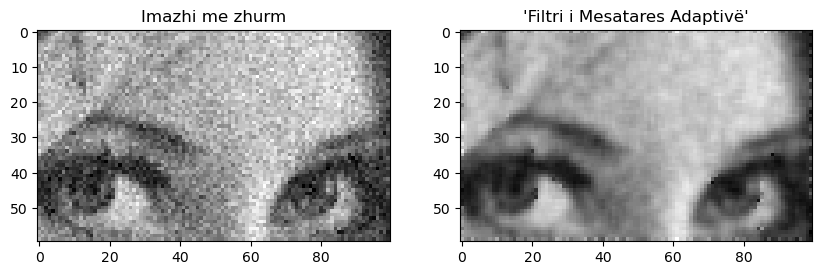

In [129]:

# Apliko filtrin e mesatares adaptivë me një dritare 3x3 dhe pragun 10
filtered_img = adaptive_mean_filter(rajoni, window_size= 3, threshold=45)
plot_image(rajoni, filtered_img, "Imazhi me zhurm", "'Filtri i Mesatares Adaptivë'", gray="yes")


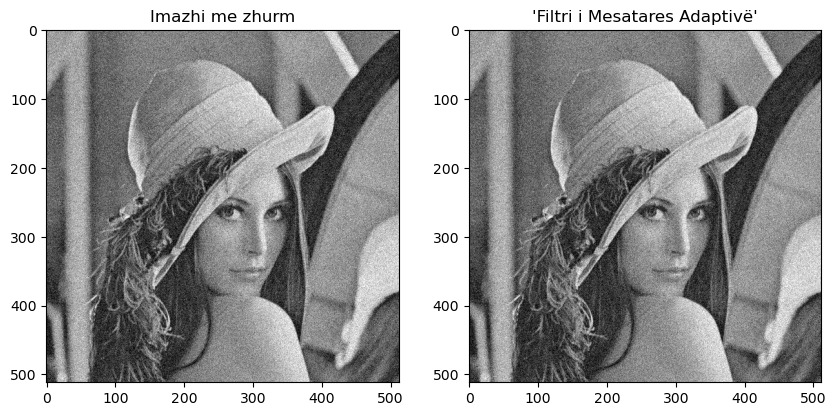

In [131]:
# Apliko filtrin e mesatares adaptivë me një dritare 3x3 dhe pragun 10
filtered_img = adaptive_mean_filter(lena_me_zhurem, window_size=3, threshold=10)
plot_image(lena_me_zhurem, filtered_img, "Imazhi me zhurm", "'Filtri i Mesatares Adaptivë'", gray="yes")


#### operacione te njepasnjeshme te filtrimit:
- Imazh me rreze-X
- Imazh me zhurmë Gaussian aditive
- Filtri mesatar aritmetik 3x3
- Filtri mesatar gjeometrik 3x3

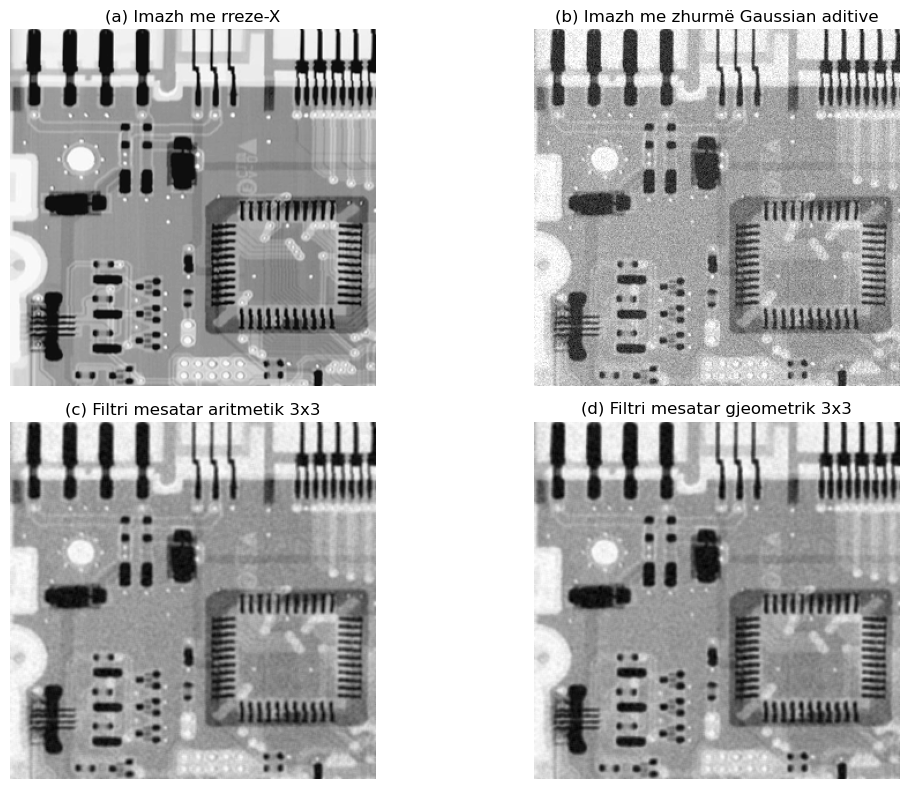

In [132]:

from scipy.ndimage import uniform_filter, generic_filter

# 1. Lexo imazhin (me rreze-X, grayscale)
img = cv2.imread('qarku.png', cv2.IMREAD_GRAYSCALE)
img = img.astype(np.float32) / 255.0  # normalizo në [0, 1]

# 2. Shto zhurmë Gaussian (μ=0, σ=0.05)
mean = 0
std = 0.05
gaussian_noise = np.random.normal(mean, std, img.shape)
noisy_img = img + gaussian_noise
noisy_img = np.clip(noisy_img, 0, 1)

# 3. Filtër mesatar aritmetik 3x3
arith_mean_filtered = uniform_filter(noisy_img, size=3)

# 4. Filtër mesatar gjeometrik 3x3
def geo_mean_filter(window):
    eps = 1e-8  # për të shmangur log(0)
    log_win = np.log(window + eps)
    return np.exp(np.mean(log_win))

geo_mean_filtered = generic_filter(noisy_img, geo_mean_filter, size=3)

# 5. Shfaq rezultatet
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('(a) Imazh me rreze-X')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(noisy_img, cmap='gray')
plt.title('(b) Imazh me zhurmë Gaussian aditive')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(arith_mean_filtered, cmap='gray')
plt.title('(c) Filtri mesatar aritmetik 3x3')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(geo_mean_filtered, cmap='gray')
plt.title('(d) Filtri mesatar gjeometrik 3x3')
plt.axis('off')

plt.tight_layout()
plt.show()


#### Eksperimente me imazhete me rreze-x per eleminimin e zhurmave krip dhe piper
(a) Shtim zhurme “piper” (pepper noise) me probabilitet 0.1

(b) Shtim zhurme “kripë” (salt noise) me probabilitet 0.1

(c) Filtrim kontraharmonik me rendin Q = 1.5 mbi imazhin me zhurmë piper

(d) Filtrim kontraharmonik me rendin Q = -1.5 mbi imazhin me zhurmë kripë



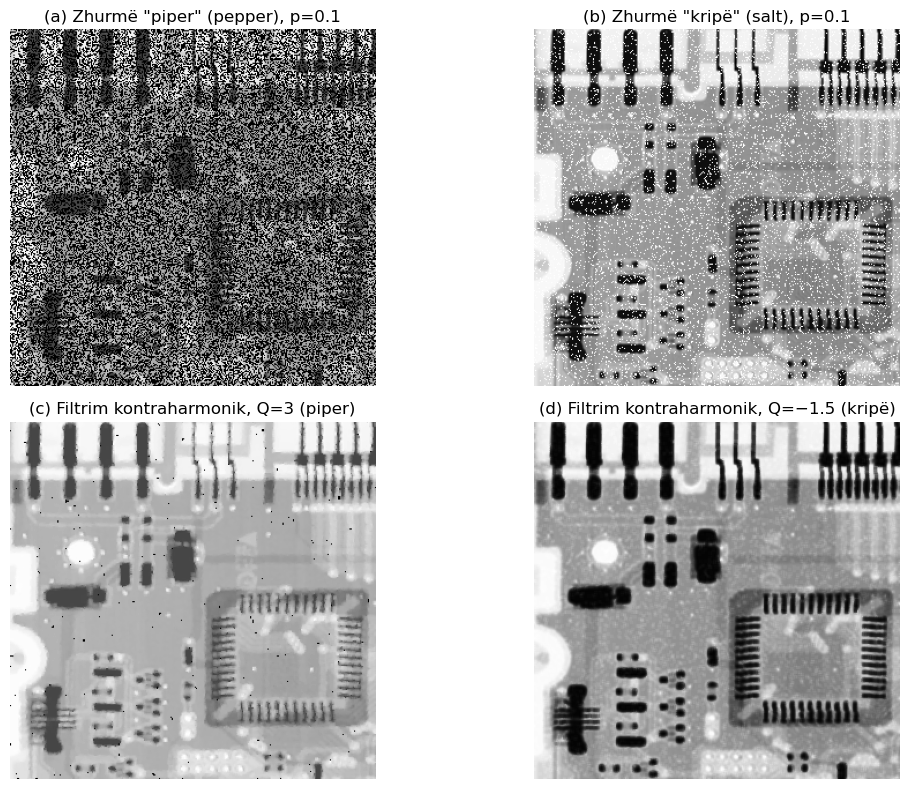

In [137]:
#  Funksione për zhurma "salt" dhe "pepper"
def add_salt_noise(image, prob):
    noisy = image.copy()
    salt = np.random.rand(*image.shape) < prob
    noisy[salt] = 1.0
    return noisy

def add_pepper_noise(image, prob):
    noisy = image.copy()
    pepper = np.random.rand(*image.shape) < prob
    noisy[pepper] = 0.0
    return noisy

# Funksioni për filtrin kontraharmonik
def contraharmonic_filter(img, Q, size):
    def ch_mean(window):
        eps = 1e-8
        window = window.astype(np.float32)
        num = np.power(window, Q + 1).sum()
        denom = np.power(window + eps, Q).sum()
        return num / denom if denom != 0 else 0

    return generic_filter(img, ch_mean, size=size)

# 4. Apliko zhurmat
pepper_img = add_pepper_noise(img, 0.5)
salt_img = add_salt_noise(img, 0.1)

# 5. Apliko filtrin kontraharmonik
pepper_filtered = contraharmonic_filter(pepper_img, Q=1.5, size=3)
salt_filtered = contraharmonic_filter(salt_img, Q=-2, size=3)

# 6. Shfaq rezultatet
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.imshow(pepper_img, cmap='gray')
plt.title('(a) Zhurmë "piper" (pepper), p=0.1')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(salt_img, cmap='gray')
plt.title('(b) Zhurmë "kripë" (salt), p=0.1')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(pepper_filtered, cmap='gray')
plt.title('(c) Filtrim kontraharmonik, Q=3 (piper)')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(salt_filtered, cmap='gray')
plt.title('(d) Filtrim kontraharmonik, Q=−1.5 (kripë)')
plt.axis('off')

plt.tight_layout()
plt.show()


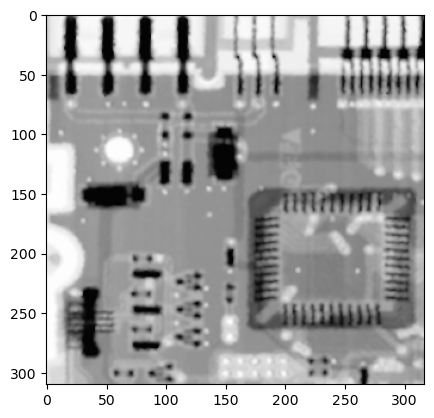

In [138]:
pepper_filtered = contraharmonic_filter(pepper_filtered, Q=1.5, size=3)
plt.imshow(pepper_filtered,'gray')
plt.show()

# Referenca

[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).

[5 ] Jian, Wushuai, Xueyan Sun, and Shuqian Luo. "Computer-aided diagnosis of breast microcalcifications based on dual-tree complex wavelet transform." Biomedical engineering online 11.1 (2012): 1-12.


<h3 align="center"> &#169; UMT. All rights reserved. <h3/>
    <h3 align="center"> anxheloshehu@umt.edu.al <h3/>

**Ushtrim 1:**
Duke perdorur filtrat e mesiperm dhe nje (ose disa) imazhe kartmonedhash te ndryshme, te percaktohen detajet e ndryshme qe mund te nxjerrin filtrat e mesiperm.
- Percaktoni se cili prej tipve(Filtra te kalimit te ulet- Filtra te kalimit te larte i nxjerr keto detaje).

**Ushtrim 2:**
- shkarkoni nje imazh MRI te trurit ku kemi prezenc te kancerit dhe nje ku nuk kemi prezenc te kancerit. 
- Apliko Filtrat ne fushen e hapsires(seminari i kaluar) ose te frekuences, dhe analizo histogramat e tyre.
- Identifiko cili prej ketyre filtrave siguron diferenc makimale midis ketyre imazheve te te njejtit tip.
###### (a mund te jet diferenca midis histogramave pas plikimit te filtrave nje metod e mire per parashikimin e malinjitetit ne tru?)